In [ ]:
from torch.utils.data import DataLoader, Dataset
import os
from time import time
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import random
from sklearn.model_selection import train_test_split
from torch.utils.data.sampler import WeightedRandomSampler
import albumentations as albu
from albumentations.pytorch import ToTensor
import segmentation_models_pytorch as smp
import numpy as np
import cv2
from matplotlib import pyplot as plt

In [2]:
BATCH_SIZE = 4
num_workers = 0
MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)
ENCODER = 'resnet34'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid'
DEVICE = 'cuda'
loss_type = 'BCEDiceContrastiveloss' # Bce, Dice, BCEDiceContrastiveloss, or other
des = 'SimUnet_0724'# 
folder = 'D:/WDD/20200723/'

In [3]:
# heavy
# https://github.com/qubvel/segmentation_models.pytorch/blob/master/examples/cars%20segmentation%20(camvid).ipynb
train_transform = albu.Compose([
    #albu.Resize(1024, 1024), 
    
    #albu.ShiftScaleRotate(scale_limit=0.4, rotate_limit=0, shift_limit=0.1, p=0.5, border_mode=0),
    #albu.HorizontalFlip(p=0.5),
    #albu.VerticalFlip(p=0.5),
    
    albu.OneOf(
            [
                albu.CLAHE(p=1),
                albu.RandomBrightness(p=1),
                #albu.RandomGamma(p=1),
            ],
            p=0.5,
        ),

    albu.OneOf(
        [
            albu.RandomContrast(p=1),
            #albu.HueSaturationValue(p=1),
        ],
        p=0.5,
    ),
    
    #albu.Normalize(mean=MEAN, std=STD),
    ToTensor()
])

val_transform = albu.Compose([
    #albu.Resize(1024, 1024), 
    #albu.Normalize(mean=MEAN, std=STD),
    ToTensor()
])

In [4]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        #plt.xticks([])
        #plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.savefig('viz.png')
    plt.show()

In [32]:
class WDDDataset(Dataset):
    def __init__(self, data_lst, pth, train=True, transform=None):
        self.data_lst = data_lst
        self.pth = pth
        with open(pth+data_lst, 'r') as f:
            files = f.read().splitlines()
        self.files = files
        self.transform = transform
        self.train = train
        #print(self.converted)

    def __getitem__(self, idx):
        image_id = self.files[idx]#.split('.')[0]
        #print(image_id)
        img_pth = os.path.join(self.pth, 'images', image_id)
        #print(img_pth)
        img = cv2.imread(img_pth)
        #print(img.shape)
        cur_img = img[:,:,0]
        his_img = img[:,:,1]
        #cur_img = cv2.cvtColor(cur_img, cv2.COLOR_GRAY2RGB)
        #his_img = cv2.cvtColor(his_img, cv2.COLOR_GRAY2RGB)
        cur_img = np.expand_dims(cur_img, 2)
        his_img = np.expand_dims(his_img, 2)
        #print(cur_img.shape)
        
        mask_pth = img_pth.replace('.bmp', '_.bmp')
        if os.path.exists(mask_pth):
            mask = cv2.imread(mask_pth, 0)
            mask[mask < 255] = 0
            mask = mask / 255
        else:
            mask = np.zeros((1024, 1024))
            
#         if self.train:
#             p = random.random()
#             if p > 0.5:
#             # flip, 
#             # 0, for flipping the image around the x-axis (vertical flipping);
#             # > 0 for flipping around the y-axis (horizontal flipping);
#             # < 0 for flipping around both axes.
#                 t = random.choice([-1, 0, 1])
#                 img_curr = cv2.flip(img_curr, t)
#                 img_hist = cv2.flip(img_hist, t)
#                 mask = cv2.flip(mask, t)
                
        if self.transform:
            augmented = self.transform(image=cur_img)
            cur_img = augmented['image']
            augmented = self.transform(image=his_img)
            his_img = augmented['image']
        #print(img.shape, mask.shape)
        
        mask = torch.from_numpy(mask).unsqueeze(0)
        #print(img_curr.shape, img_hist.shape)
        #print(mask.shape)
        
       
        
        
        if self.train:
            p = random.random()
            if p > 0.5:
                return [cur_img, his_img], [mask, mask.max()]
            else:
                return [his_img, cur_img], [mask, mask.max()]
        else:
            return [cur_img, his_img], [mask, mask.max()]

    def __len__(self):
        return len(self.files)

In [33]:
# weighted sample
train_lst = 'train1.txt'
val_lst = 'valid1.txt'
train_set = WDDDataset(train_lst, folder, True, train_transform)
valid_set = WDDDataset(val_lst, folder, False, val_transform)

# WeightedRandomSampler
target = torch.tensor([0 if mask[1]==0 else 1 for i, (img, mask) in enumerate(train_set)])
print('target train 0/1: {}/{}'.format(
    (target == 0).sum(), (target == 1).sum()))
# Compute samples weight (each sample should get its own weight)
class_sample_count = torch.tensor(
    [(target == t).sum() for t in torch.unique(target, sorted=True)])
weight = 1. / class_sample_count.float()
samples_weight = torch.tensor([weight[t] for t in target])

# Create sampler, dataset, loader
sampler = WeightedRandomSampler(samples_weight, len(samples_weight))


train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, num_workers=num_workers, sampler=sampler)
valid_loader = DataLoader(valid_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

target train 0/1: 299/86


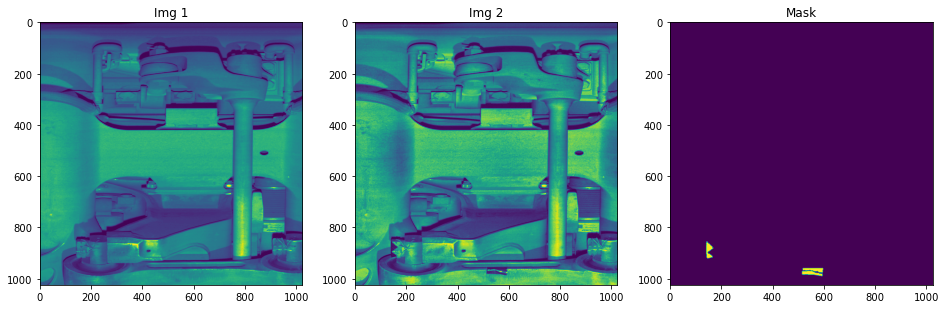

In [7]:
imgs, masks= train_set[3]
img_curr = imgs[0]
img_hist = imgs[1]
mask = masks[0]

visualize(
    img_1=img_curr.squeeze(), 
    img_2=img_hist.squeeze(), 
    mask=mask.squeeze(),
)

In [8]:
aux_params=dict(
    pooling='avg',             # one of 'avg', 'max'
    dropout=0.5,               # dropout ratio, default is None
    activation='sigmoid',      # activation function, default is None
    classes=2,                 # define number of output labels
)

In [9]:
tmp_net = smp.Unet(
                    encoder_name=ENCODER, 
                    encoder_weights=ENCODER_WEIGHTS, 
                    classes=1, 
                    in_channels=1,
                    activation=ACTIVATION,
                    aux_params=aux_params
                    )

In [10]:
class SimUnet(nn.Module):
    def __init__(self, ENCODER=ENCODER, ENCODER_WEIGHTS=ENCODER_WEIGHTS, classes=1, in_channels=3, activation=ACTIVATION):
        super().__init__()
        self.ENCODER = ENCODER
        self.ENCODER_WEIGHTS = ENCODER_WEIGHTS
        self.classes = classes
        self.in_channels = in_channels
        self.activation = ACTIVATION
        
        self.encoder1 = tmp_net.encoder
        self.encoder2 = tmp_net.encoder
        self.decoder = tmp_net.decoder
        self.segmentation_head = tmp_net.segmentation_head
        #self.classification_head = tmp_net.classification_head
        
        # features
#         torch.Size([1, 1, 512, 512])   requires_grad False, del
#         torch.Size([1, 64, 256, 256])
#         torch.Size([1, 64, 128, 128])
#         torch.Size([1, 128, 64, 64])
#         torch.Size([1, 256, 32, 32])
#         torch.Size([1, 512, 16, 16])
        self.conv1 = nn.Conv2d(1, 3, (1, 1))
        self.conv2 = nn.Conv2d(64, 64, (1, 1))
        self.conv3 = nn.Conv2d(64, 64, (1, 1))
        self.conv4 = nn.Conv2d(128, 128, (1, 1))
        self.conv5 = nn.Conv2d(256, 256, (1, 1))
        self.conv6 = nn.Conv2d(512, 512, (1, 1))
        self.bn1 = nn.BatchNorm2d(1)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(64)
        self.bn4 = nn.BatchNorm2d(128)
        self.bn5 = nn.BatchNorm2d(256)
        self.bn6 = nn.BatchNorm2d(512)
        self.ReLU = nn.ReLU()

        for param in self.parameters():
            param.requires_grad = True
        
    def forward(self, x):
        #self.net.train(self.train())
        inp1 = x[0]
        inp2 = x[1]
        f1 = self.encoder1(inp1)
        f2 = self.encoder2(inp2)
#         for i in range(5):
#             #print(f1[i].requires_grad, f1[2].requires_grad)
#             print(f1[i].shape, f2[i].shape)
        cats = []
        
        for f11, f22, conv2d, bn in zip(f1, f2, [self.conv1, self.conv2, self.conv3, self.conv4, self.conv5, self.conv6],
                                   [self.bn1, self.bn2, self.bn3, self.bn4, self.bn5, self.bn6]):
            cat = torch.abs(f11 - f22)
            conv_cat = self.ReLU(conv2d(bn(cat)))
            cats.append(conv_cat)
        decodered = self.decoder(*cats)
        output = self.segmentation_head(decodered)
#         if self.classification_head is not None:
#             labels = self.classification_head(cats[-1])
        #return [output, labels]
        return [output, f1, f2]

In [11]:
model = SimUnet()

In [12]:
# -*- encoding: utf-8 -*-
import torch
import torch.nn.functional as F

class ContrastiveLoss(torch.nn.Module):
    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        N = label.shape[0] # bs
        batch_loss = 0.
        for i in range(0, N):
            x1 = output1[i].unsqueeze(0)
            x2 = output2[i].unsqueeze(0)
            euclidean_distance = F.pairwise_distance(x1, x2, keepdim=True)
            loss_contrastive = torch.mean((1-label[i]) * torch.pow(euclidean_distance, 2) +     # calmp夹断用法
                                          (label[i]) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))
            batch_loss = batch_loss + loss_contrastive
        loss = batch_loss / N
        #print('1', output1.requires_grad)
        #print('2', output2.requires_grad)

        #print('loss',loss)
        return loss

In [14]:
class FocalLoss(smp.utils.base.Loss):
    def __init__(self, alpha=1, gamma=2, logits=True, reduce=True, name='Focal'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.logits = logits
        self.reduce = reduce

    def forward(self, inputs, targets):
        if self.logits:
            BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduce=False)
        else:
            BCE_loss = F.binary_cross_entropy(inputs, targets, reduce=False)
        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1-pt)**self.gamma * BCE_loss

        if self.reduce:
            return torch.mean(F_loss)
        else:
            return F_loss
#focal = FocalLoss()

In [13]:
class FocalDice(smp.utils.base.Loss):
    def __init__(self, weights=[1, 0.6], name='BCEDice'):
        super().__init__()
        self.name = name
        self.weights = weights
        self.focal = FocalLoss()
        self.dice_loss = smp.utils.losses.DiceLoss()
        
    def forward(self, y_pr, y_gt):
        #print(y_pr.shape)
        #print(y_gt.shape)
        loss = self.weights[0] * self.focal(y_pr, y_gt) + self.weights[1] * self.dice_loss(y_pr, y_gt)
        return loss

In [15]:
class BCEDiceContrastiveLoss(smp.utils.base.Loss):
    def __init__(self, weights=[1, 1], name='BCEDiceContrastiveLoss'):
        super().__init__()
        self.name = name
        self.weights = weights
        self.bcedice_loss = BCEDice()
        self.contrastive_loss = ContrastiveLoss()
        
    def forward(self, y_pr, y_gt):
        mask_pr, f1, f2 = y_pr[0], y_pr[1], y_pr[2]
        mask_gt, label_gt = y_gt[0], y_gt[1]
        bcedice_loss = self.bcedice_loss(mask_pr, mask_gt)
#         for i in range(6):
#             print(f1[i].requires_grad, f1[2].requires_grad)
        #contrastive_loss0 = self.contrastive_loss(f1[0], f2[0], label_gt)
        contrastive_loss1 = self.contrastive_loss(f1[1], f2[1], label_gt)
        contrastive_loss2 = self.contrastive_loss(f1[2], f2[2], label_gt)
        contrastive_loss3 = self.contrastive_loss(f1[3], f2[3], label_gt)
        contrastive_loss4 = self.contrastive_loss(f1[4], f2[4], label_gt)
        contrastive_loss5 = self.contrastive_loss(f1[5], f2[5], label_gt)
#         print('bcedice_loss', bcedice_loss)
#         #print('contrastive_loss0', contrastive_loss0)
#         print('contrastive_loss1', contrastive_loss1)
#         print('contrastive_loss2', contrastive_loss2)
#         print('contrastive_loss3', contrastive_loss3)
#         print('contrastive_loss4', contrastive_loss4)
#         print('contrastive_loss5', contrastive_loss5)
#         bcedice_loss tensor(1.8070, device='cuda:0', grad_fn=<AddBackward0>)
#         contrastive_loss0 tensor(3.6144, device='cuda:0')
#         contrastive_loss1 tensor(3.0072, device='cuda:0', grad_fn=<DivBackward0>)
#         contrastive_loss2 tensor(1.0025, device='cuda:0', grad_fn=<DivBackward0>)
#         contrastive_loss3 tensor(0.4298, device='cuda:0', grad_fn=<DivBackward0>)
#         contrastive_loss4 tensor(0.2995, device='cuda:0', grad_fn=<DivBackward0>)
#         contrastive_loss5 tensor(0., device='cuda:0', grad_fn=<DivBackward0>)
        loss = bcedice_loss + contrastive_loss1*0.5 + contrastive_loss2*0.4 + contrastive_loss3*0.3 + contrastive_loss4*0.2 + contrastive_loss5*0.1
        return loss
BCEDiceContrastiveloss = BCEDiceContrastiveLoss()

In [16]:
class combinedLoss(smp.utils.base.Loss):
    def __init__(self, weights=[1, 1], name='combinedLoss'):
        super().__init__()
        self.name = name
        self.weights = weights
        self.bcedice = BCEDice()
        self.ContrLoss = ContrastiveLoss()
        #self.cls_head = smp.utils.losses.CrossEntropyLoss()
        
    def forward(self, inpt, y_gt):
        mask_pr, f1, f2 = inpt[0], inpt[1], inpt[2]
        mask_gt, label_gt = y_gt[0], y_gt[1]
        loss_bcedice = self.bcedice(mask_pr, mask_gt)
#         for i in range(6):
#             print(f1[i].shape, f2[i].shape, label_gt.shape)
        loss_contr = self.ContrLoss(f1[0], f2[0], label_gt) + self.ContrLoss(f1[1], f2[1], label_gt) + self.ContrLoss(f1[2], f2[2], label_gt) +\
        self.ContrLoss(f1[3], f2[3], label_gt) + self.ContrLoss(f1[4], f2[4], label_gt) + self.ContrLoss(f1[5], f2[5], label_gt)
        #print('label_pr', label_pr.shape)
        #print('label_gt', label_gt.shape)
        #print(label_pr.dtype)
        #print(label_gt.dtype)
        #loss_cls = self.cls_head(label_pr, label_gt)
        return loss_bcedice + loss_contr
    
cLoss = combinedLoss()

In [17]:
if loss_type == 'Bce':
    loss = smp.utils.losses.BCEWithLogitsLoss()
    loss_key = 'bce_with_logits_loss'
elif loss_type == 'Dice':
    loss = smp.utils.losses.DiceLoss()
    loss_key = 'dice_loss'
elif loss_type == 'BCEDiceContrastiveloss':
    loss = BCEDiceContrastiveloss
    loss_key = 'bce_dice_contrastive_loss'
else:
    loss = cLoss
    loss_key = 'combined_loss'
    
#loss = smp.utils.losses.DiceLoss() #smp.utils.losses.BCEWithLogitsLoss() # smp.utils.losses.BCEWithLogitsLoss() # smp.utils.losses.DiceLoss()

In [18]:
loss

BCEDiceContrastiveLoss(
  (bcedice_loss): BCEDice(
    (focal): FocalLoss()
    (dice_loss): DiceLoss(
      (activation): Activation(
        (activation): Identity()
      )
    )
  )
  (contrastive_loss): ContrastiveLoss()
)

In [19]:
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [20]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [21]:
def savelogs(logs, name):
    with open(f'{name}.txt', 'a') as f:
        for k, v in logs.items():
            f.write(f'{k} {v}')
        f.write('\n')

In [ ]:
max_score = 1e5
losses = {}
ious = {}
losses['train'] = []
losses['valid'] = []
ious['train'] = []
ious['valid'] = []

for i in range(0, 120):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    savelogs(train_logs, f'./logs/train_logs_{des}')
    savelogs(valid_logs, f'./logs/valid_logs_{des}')
    
    losses['train'].append(train_logs[loss_key])
    losses['valid'].append(valid_logs[loss_key])
    ious['train'].append(train_logs['iou_score'])
    ious['valid'].append(valid_logs['iou_score'])
    #break
    # do something (save model, change lr, etc.)
    # val loss
    if max_score > valid_logs['bce_dice_contrastive_loss']:
        max_score = valid_logs['bce_dice_contrastive_loss']
        torch.save(model, f'./logs/{des}.pth')
        print('Model saved!')
        
    if i == 35:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')
    
    if i == 65:
        optimizer.param_groups[0]['lr'] = 1e-6
        print('Decrease decoder learning rate to 1e-6!')
    
    if i == 95:
        optimizer.param_groups[0]['lr'] = 1e-7
        print('Decrease decoder learning rate to 1e-7!')

In [23]:
train_logs

{'bce_dice_contrastive_loss': 1.71775462200607,
 'iou_score': 0.7415312452205984}

In [24]:
valid_logs

{'bce_dice_contrastive_loss': 1.7706629362176889,
 'iou_score': 0.854466778448242}

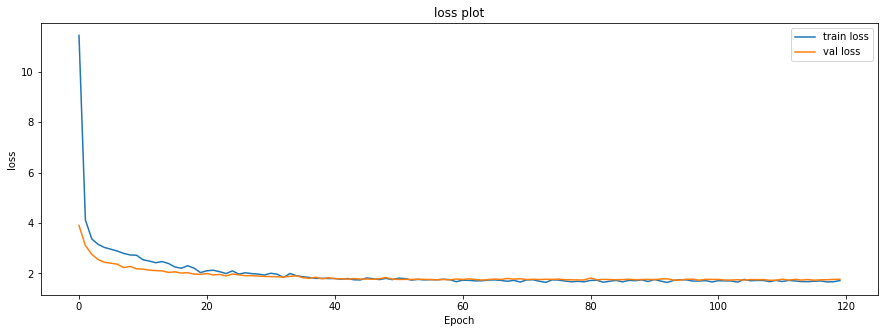

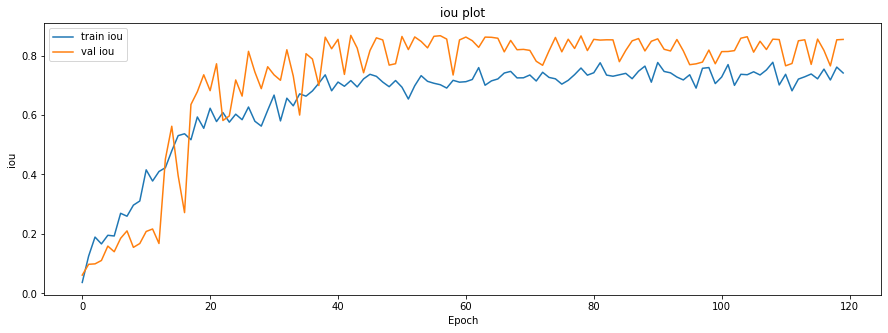

In [25]:
# PLOT TRAINING

def plot(scores, name):
    plt.figure(figsize=(15,5))
    plt.plot(range(len(scores["train"])), scores["train"], label=f'train {name}')
    plt.plot(range(len(scores["train"])), scores["valid"], label=f'val {name}')
    plt.title(f'{name} plot'); plt.xlabel('Epoch'); plt.ylabel(f'{name}');
    plt.legend(); 
    plt.show()

plot(losses, "loss")
plot(ious, "iou")

In [26]:
best_model = torch.load(f'./logs/{des}.pth')

In [27]:
des

'SimUnet_0724'

In [34]:
# create test dataset
test_dataset = valid_set

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE)

In [29]:
%%time
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

valid: 100%|██████████| 22/22 [00:05<00:00,  3.80it/s, bce_dice_contrastive_loss - 1.731, iou_score - 0.8553]
Wall time: 5.81 s


In [35]:
# test dataset without transformations for image visualization
test_dataset_vis = WDDDataset(val_lst, folder, False)

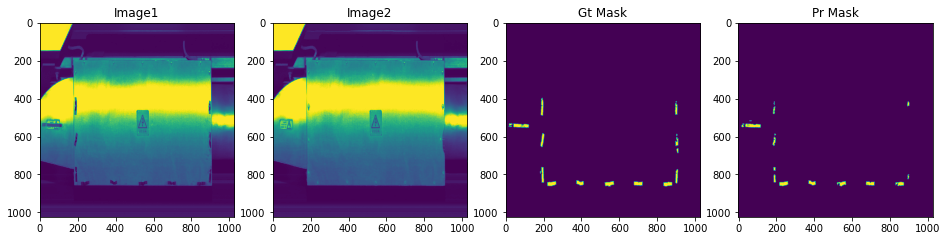

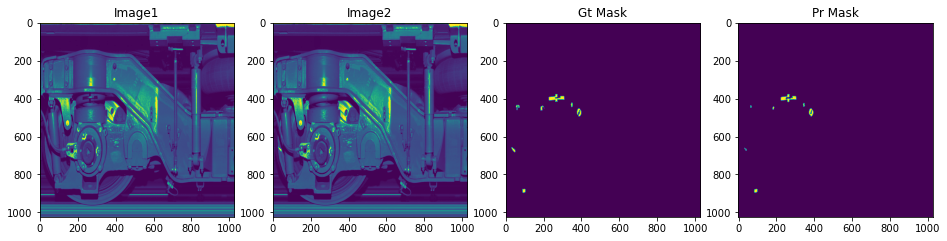

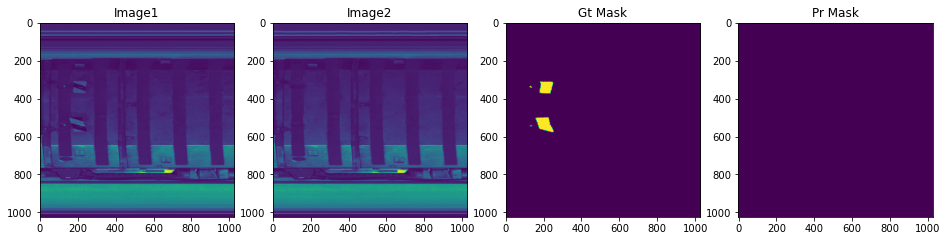

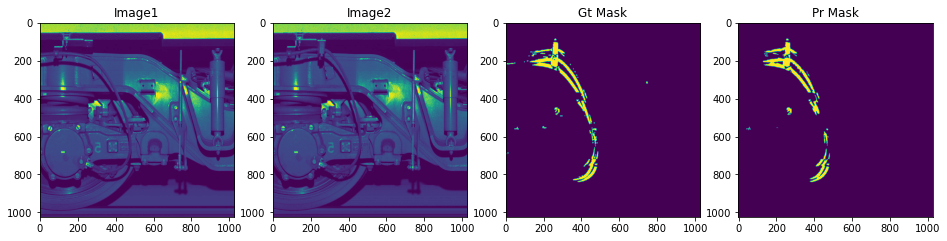

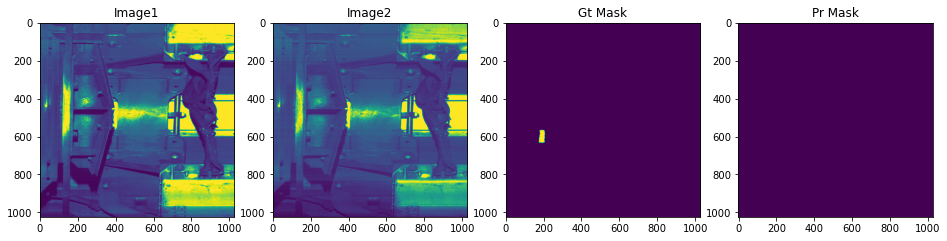

...

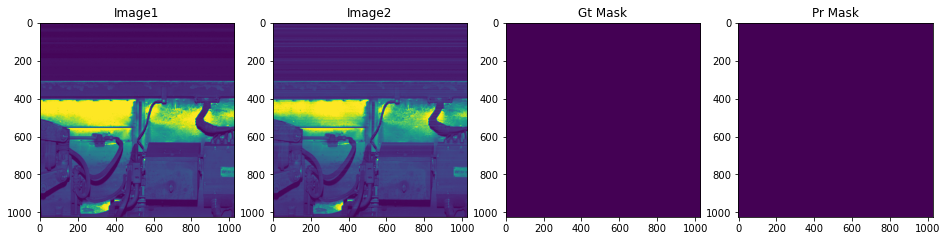

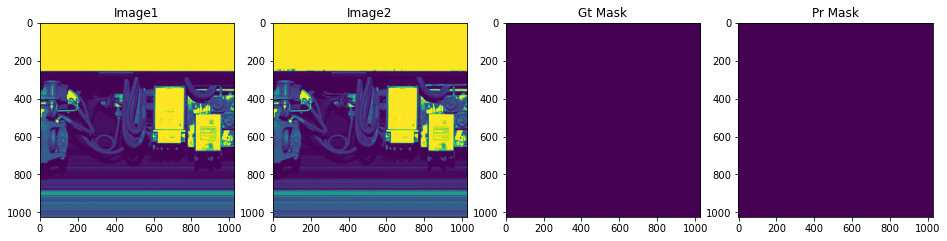

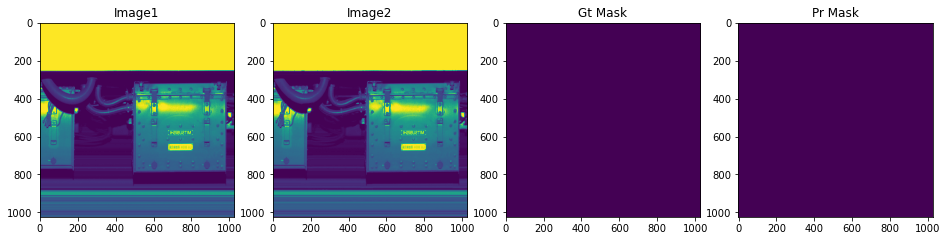

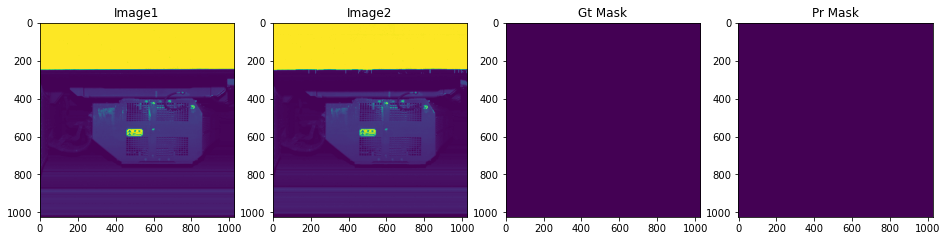

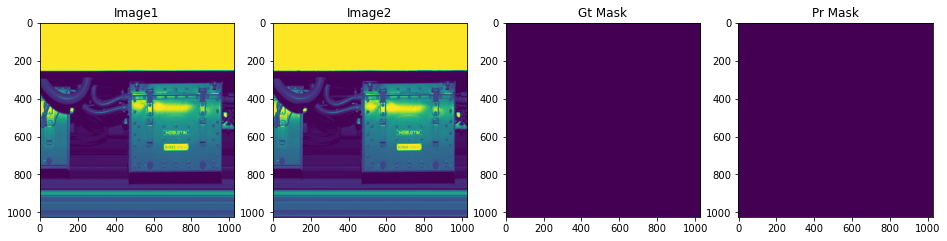

In [38]:
best_model.eval()
for i in range(len(test_dataset)):
    #n = np.random.choice(len(test_dataset))
    n = i
    image1_vis, image2_vis = test_dataset_vis[n][0]
    images, gt_mask = test_dataset[n]
    
    gt_mask = gt_mask#.squeeze()
    
    #image = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model([images[0].unsqueeze(0).cuda(), images[1].unsqueeze(0).cuda()])[0]
    pr_mask = (pr_mask.squeeze().cpu().detach().numpy().round())
        
    visualize(
        image1=image1_vis[:,:,0], 
        image2=image2_vis[:,:,0],
        gt_mask=gt_mask[0][0], 
        pr_mask=pr_mask,
    )

In [ ]:
pth = 'D:/WDD/train_data_1/'
def create_img2(image_name, phase):
    """
    phase: 
        0: curr, hist
        1: hist, curr
        2: curr, curr
        3: hist, hist
    """
    curr_img_pth = os.path.join(pth, 'curr_hist', image_name + '_curr.jpg')
    hist_img_pth = os.path.join(pth, 'curr_hist', image_name + '_hist.jpg')

    img_curr = cv2.imread(curr_img_pth)
    img_curr = cv2.cvtColor(img_curr, cv2.COLOR_BGR2RGB)

    img_hist = cv2.imread(hist_img_pth)
    img_hist = cv2.cvtColor(img_hist, cv2.COLOR_BGR2RGB)

    mask_pth = pth + 'mask/' + image_name + '.jpg'
    mask = cv2.imread(mask_pth, 0)
    mask[mask < 255] = 0
    mask = mask / 255
    #print(mask.shape)
    
    if phase == 0:
        return [img_curr, img_hist], mask, mask.max()
    if phase == 1:
        return [img_hist, img_curr], mask, mask.max()
    if phase == 2:
        return [img_curr, img_curr], mask*0, mask.max()
    if phase == 3:
        return [img_hist, img_hist], mask*0, mask.max()

In [ ]:
# trust mask
from tqdm import tqdm
res_dict = {}
for img_name in tqdm(os.listdir('D:/WDD/train_data_1/image/')):
    res_dict[img_name] = {}
    for phase, describ in zip([0,1,2,3], ['ch', 'hc', 'cc', 'hh']):
        imgs, mask, label = create_img2(img_name.split('.')[0], phase=phase)
        image1_ = val_transform(image=imgs[0])['image']
        image2_ = val_transform(image=imgs[1])['image']
        #image = image_[1:,:,:]
        pr_mask = best_model([image1_.unsqueeze(0).cuda(), image2_.unsqueeze(0).cuda()])[0]
        pr_mask = (pr_mask.squeeze().cpu().detach().numpy().round())
        
        res_dict[img_name][describ] = f'{mask.sum()}_{pr_mask.sum()}' #check(mask, pr_mask)

In [ ]:
wrong_alert, miss_alert = {}, {}
wrong_alert['ch'], wrong_alert['hc'], wrong_alert['cc'], wrong_alert['hh'] = 0, 0, 0, 0
miss_alert['ch'], miss_alert['hc'], miss_alert['cc'], miss_alert['hh'] = 0, 0, 0, 0
for k, v in res_dict.items():
    for kk, vv in v.items():
        t1, t2 = vv.split('_')
        if eval(t1) == 0. and eval(t2) != 0.:  # 误报
            wrong_alert[kk] += 1
            if kk == 'hh':
                print(k)
        elif eval(t1) != 0. and eval(t2) == 0.:  # 漏报
            miss_alert[kk] += 1

In [ ]:
wrong_alert

In [ ]:
miss_alert

In [ ]:
# wrong_alert {'ch': 2, 'hc': 2, 'cc': 0, 'hh': 0}
# miss_alert {'ch': 9, 'hc': 9, 'cc': 0, 'hh': 0}